# Final project - Telecom

## Table of Contents:

* [Project description](#description)
* [Description of the data](#data)
* [Open the data file](#open)
* [Data Reading and Data Cleaning](#read)
* [EDA](#EDA)
    * [Response Variable](#ResponseVariable)
    * [Demographic Information](#Demographic)
    * [Customer Account Information — Categorical variables](#CustomerAccount)
    * [Customer Account Information — Numerical variables](#CustomerAccountNumerical)
    * [Services Information](#ServicesInformation)
    * [Feature Importance](#Featureimportance)
    * [Customer Exception](#customerexception)
* [Work Plan](#Work_Plan)
* [Prepare data for machine learning](#Prepare)
    * [Feature Engineering](#Engineering)
        * [Label Encoding](#LabelEncoding)
        * [One-Hot Encoding](#One-HotEncoding)
    * [Checking for Outliers](#outliers)
    * [Spliting the Data](#spliting)
    * [Scaling](#scaling)
* [Models](#models)
    * [Random forest classfier](#Randomforest)
    * [Gradient Boosting](#GradientBoosting)
        * [Gradient Boosting Classifier](#GradientBoostingClassifier)
        * [Lightgbm Classifier](#LightgbmClassifier)
        * [CatBoost Classifier](#CatBoostClassifier)
    * [Improving the Model](#improving)
        * [Resampling](#resampling)
        * [Eliminating features of less importance](#Eliminating)
    * [Baseline model for sanity check](#sanity)
* [Conclusion](#Conclusion)
* [Solution Report](#Solution)

## Project description <a class="anchor" id="description"></a>

The telecom operator Interconnect would like to be able to forecast their churn of clients. If it's discovered that a user is planning to leave, they will be offered promotional codes and special plan options. Interconnect's marketing team has collected some of their clientele's personal data, including information about their plans and contracts.

#### Interconnect's services

Interconnect mainly provides two types of services:

1. Landline communication. The telephone can be connected to several lines simultaneously.
2. Internet. The network can be set up via a telephone line (DSL, *digital subscriber line*) or through a fiber optic cable.

Some other services the company provides include:

- Internet security: antivirus software (*DeviceProtection*) and a malicious website blocker (*OnlineSecurity*)
- A dedicated technical support line (*TechSupport*)
- Cloud file storage and data backup (*OnlineBackup*)
- TV streaming (*StreamingTV*) and a movie directory (*StreamingMovies*)

The clients can choose either a monthly payment or sign a 1- or 2-year contract. They can use various payment methods and receive an electronic invoice after a transaction.

##### Target feature: 
the `'EndDate'` column equals `'No'`.

Primary metric: AUC-ROC.

Additional metric: Accuracy.

### Description of the data  <a class="anchor" id="data"></a>

The data consists of files obtained from different sources:

- contract — contract information:
    * begindate: the date where the  customer registered to the service  
    * enddate: the target - the date where the  customer exited to the service or it didn't -'No'
    * type: Indicates the customer’s current contract type (Month-to-Month, One year, Two year).
    * PaperlessBilling: Whether the client has paperless billing or not (Yes, No).
    * PaymentMethod: The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit Card (automatic)).
    * MontlyCharges: The amount charged to the customer monthly (Multiple different numeric values).
    * TotalCharges: The total amount charged to the customer (Multiple different numeric values).
    
- personal — the client's personal data:
    * gender: Whether the client is a female or a male (Female, Male).
    * SeniorCitizen: Whether the client is a senior citizen or not ( 0, 1).
    * Partner: Whether the client has a partner or not (Yes, No).
    * Dependents: Whether the client has dependents or not (Yes, No).
    
- internet — information about Internet services:
    * InternetServices: Whether the client is subscribed to Internet service with the company (DSL, Fiber optic, No)
    * OnlineSecurity: Whether the client has online security or not (No internet service, No, Yes).
    * OnlineBackup: Whether the client has online backup or not (No internet service, No, Yes).
    * DeviceProtection: Whether the client has device protection or not (No internet service, No, Yes).
    * TechSupport: Whether the client has tech support or not (No internet service, No, Yes).
    * StreamingTV: Whether the client has streaming TV or not (No internet service, No, Yes).
    * StreamingMovies: Whether the client has streaming movies or not (No internet service, No, Yes).
    
- phone.csv — information about telephone services:
    * MultipleLines: Whether the client has multiple lines or not (No phone service, No, Yes).

In each file, the column `customerID` contains a unique code assigned to each client.

## Open the data file<a class="anchor" id='open'></a>

In [1]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import warnings
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from numpy.random import RandomState
from pprint import pprint
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
import warnings
from sklearn.preprocessing import StandardScaler
import time
from statistics import mean
import catboost as cb
from sklearn.preprocessing import OrdinalEncoder
from catboost import Pool, cv
import math
import lightgbm as lgb
import xgboost as xgb
import sklearn.metrics as metrics
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.utils import shuffle
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.metrics import auc
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import StratifiedKFold
warnings.filterwarnings('ignore')

In [2]:
#openfiles from directory
try:
    df_contract = pd.read_csv('contract.csv')
    df_internet = pd.read_csv('internet.csv')
    df_personal = pd.read_csv('personal.csv')
    df_phone = pd.read_csv('phone.csv')
except:
    print("Something went wrong when opening the file")

### Data Reading and Data Cleaning<a class="anchor" id="read"></a>

In [3]:
#changing features names to lowercase
df_contract.columns= df_contract.columns.str.lower()
df_contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerid        7043 non-null   object 
 1   begindate         7043 non-null   object 
 2   enddate           7043 non-null   object 
 3   type              7043 non-null   object 
 4   paperlessbilling  7043 non-null   object 
 5   paymentmethod     7043 non-null   object 
 6   monthlycharges    7043 non-null   float64
 7   totalcharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


In [4]:
#changing totalcharges to float data type
df_contract['totalcharges'] =  pd.to_numeric(df_contract['totalcharges'],errors = 'coerce')

In [5]:
df_contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerid        7043 non-null   object 
 1   begindate         7043 non-null   object 
 2   enddate           7043 non-null   object 
 3   type              7043 non-null   object 
 4   paperlessbilling  7043 non-null   object 
 5   paymentmethod     7043 non-null   object 
 6   monthlycharges    7043 non-null   float64
 7   totalcharges      7032 non-null   float64
dtypes: float64(2), object(6)
memory usage: 440.3+ KB


In [6]:
#checking for missing values
report = df_contract.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_contract.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
totalcharges,11,0.0
customerid,0,0.0
begindate,0,0.0
enddate,0,0.0
type,0,0.0
paperlessbilling,0,0.0
paymentmethod,0,0.0
monthlycharges,0,0.0


In [7]:
#there are 11 missing values that need to be dropped
df_contract = df_contract.dropna(subset=['totalcharges'])


In [8]:
print("duplicates number: {}".format(df_contract.duplicated().sum()))

duplicates number: 0


In [9]:
#checking for missing values
report = df_contract.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_contract.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
begindate,0,0.0
enddate,0,0.0
type,0,0.0
paperlessbilling,0,0.0
paymentmethod,0,0.0
monthlycharges,0,0.0
totalcharges,0,0.0


In [10]:
#changing feature  to lowercase
df_contract['type'] = df_contract['type'].str.lower()
df_contract['paymentmethod'] = df_contract['paymentmethod'].str.lower()

In [11]:
#changing feature data type to date type
df_contract["begindate"] = pd.to_datetime(df_contract['begindate'], format='%Y-%m-%d')

In [12]:
df_contract.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerid        7032 non-null   object        
 1   begindate         7032 non-null   datetime64[ns]
 2   enddate           7032 non-null   object        
 3   type              7032 non-null   object        
 4   paperlessbilling  7032 non-null   object        
 5   paymentmethod     7032 non-null   object        
 6   monthlycharges    7032 non-null   float64       
 7   totalcharges      7032 non-null   float64       
dtypes: datetime64[ns](1), float64(2), object(5)
memory usage: 494.4+ KB


In [13]:
#changing features names to lowercase
df_internet.columns= df_internet.columns.str.lower()
df_internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerid        5517 non-null   object
 1   internetservice   5517 non-null   object
 2   onlinesecurity    5517 non-null   object
 3   onlinebackup      5517 non-null   object
 4   deviceprotection  5517 non-null   object
 5   techsupport       5517 non-null   object
 6   streamingtv       5517 non-null   object
 7   streamingmovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [14]:
#changing feature  to lowercase
df_internet['internetservice'] = df_internet['internetservice'].str.lower()

In [15]:
df_internet.sample(5)

,customerid,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies
520,4580-TMHJU,dsl,No,No,No,No,Yes,No
3262,9741-YLNTD,fiber optic,No,No,No,Yes,No,Yes
4129,0997-YTLNY,dsl,No,No,No,Yes,No,No
3608,8705-DWKTI,fiber optic,No,No,Yes,No,No,Yes
757,6115-ZTBFQ,dsl,Yes,Yes,Yes,Yes,Yes,Yes


In [16]:
#checking for missing values
report = df_internet.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_internet.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
internetservice,0,0.0
onlinesecurity,0,0.0
onlinebackup,0,0.0
deviceprotection,0,0.0
techsupport,0,0.0
streamingtv,0,0.0
streamingmovies,0,0.0


In [17]:
print("duplicates number: {}".format(df_internet.duplicated().sum()))

duplicates number: 0


In [18]:
#changing features names to lowercase
df_personal.columns= df_personal.columns.str.lower()
df_personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerid     7043 non-null   object
 1   gender         7043 non-null   object
 2   seniorcitizen  7043 non-null   int64 
 3   partner        7043 non-null   object
 4   dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [19]:
df_personal.sample(5)

,customerid,gender,seniorcitizen,partner,dependents
5183,8988-ECPJR,Female,1,Yes,Yes
5391,8124-NZVGJ,Female,0,No,No
2725,4236-UJPWO,Female,0,No,No
6467,9494-MRNYX,Male,0,No,No
5668,0147-ESWWR,Female,1,Yes,No


In [20]:
#checking for missing values
report = df_personal.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_personal.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
gender,0,0.0
seniorcitizen,0,0.0
partner,0,0.0
dependents,0,0.0


In [21]:
print("duplicates number: {}".format(df_internet.duplicated().sum()))

duplicates number: 0


In [22]:
#changing features names to lowercase
df_phone.columns= df_phone.columns.str.lower()
df_phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerid     6361 non-null   object
 1   multiplelines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [23]:
df_phone.sample(5)

,customerid,multiplelines
831,5149-TGWDZ,No
1855,8305-VHZBZ,No
1208,6475-VHUIZ,No
3924,1455-ESIQH,No
415,9076-AXYIK,Yes


In [24]:
#checking for missing values
report = df_phone.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_phone.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
multiplelines,0,0.0


In [25]:
print("duplicates number: {}".format(df_phone.duplicated().sum()))

duplicates number: 0


In [26]:
#mergeing data sets
total_df = pd.merge(df_contract, df_personal, on=['customerid'])

In [27]:
#checking for missing values
report = total_df.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / total_df.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
begindate,0,0.0
enddate,0,0.0
type,0,0.0
paperlessbilling,0,0.0
paymentmethod,0,0.0
monthlycharges,0,0.0
totalcharges,0,0.0
gender,0,0.0
seniorcitizen,0,0.0


In [28]:
total_df.sample(5)

,customerid,begindate,enddate,type,paperlessbilling,paymentmethod,monthlycharges,totalcharges,gender,seniorcitizen,partner,dependents
6528,1444-VVSGW,2014-03-01,2020-01-01 00:00:00,one year,No,credit card (automatic),115.65,7968.85,Male,0,Yes,No
1842,1098-KFQEC,2015-07-01,No,two year,No,credit card (automatic),19.40,1083.00,Female,0,Yes,Yes
6035,1689-YQBYY,2019-02-01,No,month-to-month,Yes,electronic check,76.60,893.00,Female,0,No,Yes
4297,9732-OUYRN,2016-01-01,No,one year,No,credit card (automatic),19.00,918.70,Female,0,Yes,No
188,0956-SYCWG,2019-01-01,No,one year,No,electronic check,19.65,244.80,Female,0,No,No


In [29]:
#mergeing data sets
total_df_2 = pd.merge(total_df, df_internet, on=['customerid'], how='left')

In [30]:
total_df_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7031
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerid        7032 non-null   object        
 1   begindate         7032 non-null   datetime64[ns]
 2   enddate           7032 non-null   object        
 3   type              7032 non-null   object        
 4   paperlessbilling  7032 non-null   object        
 5   paymentmethod     7032 non-null   object        
 6   monthlycharges    7032 non-null   float64       
 7   totalcharges      7032 non-null   float64       
 8   gender            7032 non-null   object        
 9   seniorcitizen     7032 non-null   int64         
 10  partner           7032 non-null   object        
 11  dependents        7032 non-null   object        
 12  internetservice   5512 non-null   object        
 13  onlinesecurity    5512 non-null   object        
 14  onlinebackup      5512 n

In [31]:
all_df = pd.merge(total_df_2, df_phone, on=['customerid'], how='left')

In [32]:
all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerid        7032 non-null   object        
 1   begindate         7032 non-null   datetime64[ns]
 2   enddate           7032 non-null   object        
 3   type              7032 non-null   object        
 4   paperlessbilling  7032 non-null   object        
 5   paymentmethod     7032 non-null   object        
 6   monthlycharges    7032 non-null   float64       
 7   totalcharges      7032 non-null   float64       
 8   gender            7032 non-null   object        
 9   seniorcitizen     7032 non-null   int64         
 10  partner           7032 non-null   object        
 11  dependents        7032 non-null   object        
 12  internetservice   5512 non-null   object        
 13  onlinesecurity    5512 non-null   object        
 14  onlinebackup      5512 n

In [33]:
all_df.sample(5)

,customerid,begindate,enddate,type,paperlessbilling,paymentmethod,monthlycharges,totalcharges,gender,seniorcitizen,partner,dependents,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,multiplelines
279,4130-MZLCC,2019-09-01,No,month-to-month,No,bank transfer (automatic),50.55,244.75,Female,0,No,No,dsl,No,Yes,No,No,No,No,No
286,3808-HFKDE,2018-06-01,No,month-to-month,Yes,electronic check,44.35,927.15,Female,0,No,No,dsl,No,No,No,No,No,No,No
6376,0702-PGIBZ,2019-08-01,2019-12-01 00:00:00,month-to-month,Yes,electronic check,101.70,364.55,Male,0,No,Yes,fiber optic,No,Yes,No,No,Yes,Yes,Yes
1666,1442-OKRJE,2014-08-01,No,one year,Yes,bank transfer (automatic),103.15,7031.30,Male,0,Yes,Yes,fiber optic,Yes,Yes,Yes,No,Yes,Yes,No
4867,2302-ANTDP,2015-10-01,2019-10-01 00:00:00,month-to-month,No,electronic check,117.45,5438.90,Female,1,Yes,No,fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [34]:
services_columns =  ['onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'multiplelines','internetservice']

In [35]:
#filling the missing values 
for column in services_columns:
    if column == 'multiplelines':
        all_df[column]=all_df[column].fillna('No_phone')
    else:
        all_df[column]=all_df[column].fillna('No_internet')

In [36]:
#checking for missing values
report = all_df.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / all_df.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
begindate,0,0.0
streamingmovies,0,0.0
streamingtv,0,0.0
techsupport,0,0.0
deviceprotection,0,0.0
onlinebackup,0,0.0
onlinesecurity,0,0.0
internetservice,0,0.0
dependents,0,0.0


In [37]:
#making a churn_date feature and user_tenure
all_df['churn_date'] = all_df['enddate'].apply(lambda row: '2020-02-01 00:00:00' if row == 'No' else row)
all_df['churn_date'] = all_df['churn_date'].astype('datetime64[ns]')
#making a feature with the life time of the user
all_df['user_tenure'] = (all_df['churn_date'].astype('datetime64[M]') - all_df['begindate'].astype('datetime64[M]'))
all_df['user_tenure'] = all_df['user_tenure'] / np.timedelta64(1, 'M')
all_df['user_tenure'] = all_df['user_tenure'].round().astype(int)

###### changing the enddate - target to binary

In [38]:
df_telco = all_df.copy()
df_telco['enddate'] = df_telco['enddate'].apply(lambda row: 0 if row == 'No' else 1)

In [39]:
#checking for missing values
report = df_telco.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_telco.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
begindate,0,0.0
churn_date,0,0.0
multiplelines,0,0.0
streamingmovies,0,0.0
streamingtv,0,0.0
techsupport,0,0.0
deviceprotection,0,0.0
onlinebackup,0,0.0
onlinesecurity,0,0.0


## EDA<a class="anchor" id="EDA"></a>

##### Response Variable<a class="anchor" id="ResponseVariable"></a>

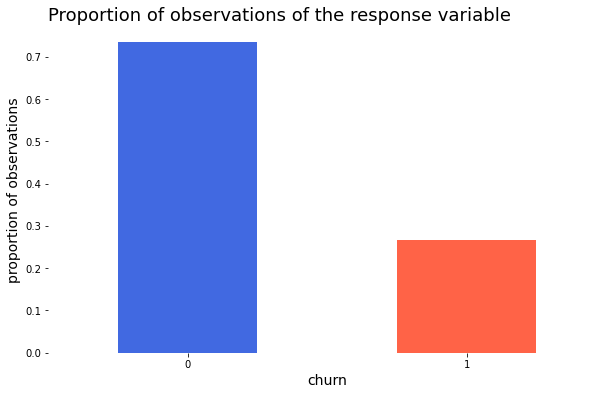

In [40]:

# create a figure
fig = plt.figure(figsize=(10, 6)) 
ax = fig.add_subplot(111)

# proportion of observation of each class
prop_response = df_telco['enddate'].value_counts(normalize=True)

# create a bar plot showing the percentage of churn
prop_response.plot(kind='bar', 
                   ax=ax,
                   color=['royalblue','tomato'])

# set title and labels
ax.set_title('Proportion of observations of the response variable',
             fontsize=18, loc='left')
ax.set_xlabel('churn',
              fontsize=14)
ax.set_ylabel('proportion of observations',
              fontsize=14)
ax.tick_params(rotation='auto')

# eliminate the frame from the plot
spine_names = ('top', 'right', 'bottom', 'left')
for spine_name in spine_names:
    ax.spines[spine_name].set_visible(False)

<div  style="border: solid black 2px; padding: 20px"> <b> Note:</b>
We can infer that the target is imbalnced 

##### Demographic Information <a class="anchor" id="Demographic"></a>

In [41]:
def percentage_stacked_plot(columns_to_plot, super_title):
    
    '''
    Prints a 100% stacked plot of the response variable for independent variable of the list columns_to_plot.
            Parameters:
                    columns_to_plot (list of string): Names of the variables to plot
                    super_title (string): Super title of the visualization
            Returns:
                    None
    '''
    
    number_of_columns = 2
    number_of_rows = math.ceil(len(columns_to_plot)/2)

    # create a figure
    fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
    fig.suptitle(super_title, fontsize=22,  y=.95)
 

    # loop to each column name to create a subplot
    for index, column in enumerate(columns_to_plot, 1):

        # create the subplot
        ax = fig.add_subplot(number_of_rows, number_of_columns, index)

        # calculate the percentage of observations of the response variable for each group of the independent variable
        # 100% stacked bar plot
        prop_by_independent = pd.crosstab(df_telco[column], df_telco['enddate']).apply(lambda x: x/x.sum()*100, axis=1)

        prop_by_independent.plot(kind='bar', ax=ax, stacked=True,
                                 rot=0, color=['royalblue','tomato'])

        # set the legend in the upper right corner
        ax.legend(loc="upper right", bbox_to_anchor=(0.62, 0.5, 0.5, 0.5),
                  title='Churn', fancybox=True)

        # set title and labels
        ax.set_title('Proportion of observations by ' + column,
                     fontsize=16, loc='left')

        ax.tick_params(rotation='auto')

        # eliminate the frame from the plot
        spine_names = ('top', 'right', 'bottom', 'left')
        for spine_name in spine_names:
            ax.spines[spine_name].set_visible(False)

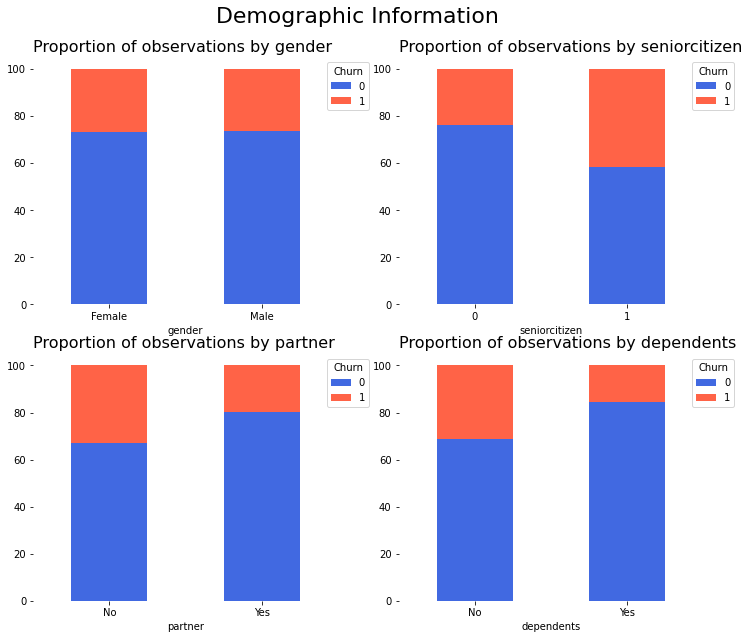

In [42]:
# demographic column names
demographic_columns = ['gender', 'seniorcitizen', 'partner', 'dependents']

# stacked plot of demographic columns
percentage_stacked_plot(demographic_columns, 'Demographic Information')

<div  style="border: solid black 2px; padding: 20px"> <b> </b>

We can extract the following conclusions by analyzing demographic attributes:

* The churn rate of senior citizens is almost double that of young citizens.
* We do not expect gender to have significant predictive power. A similar percentage of churn is shown both when a customer is a man or a woman.
* Customers with a partner churn less than customers with no partner.

##### Customer Account Information — Categorical variables <a class="anchor" id="CustomerAccount"></a>

In [43]:
#As shown below, some payment method denominations contain in parenthesis the word automatic. 
#These denominations are too long to be used as tick labels in further visualizations. 
#Therefore, we remove this clarification in parenthesis from the entries of the PaymentMethod column.
df_telco['paymentmethod'] = df_telco['paymentmethod'].str.replace(' (automatic)', '', regex=False)


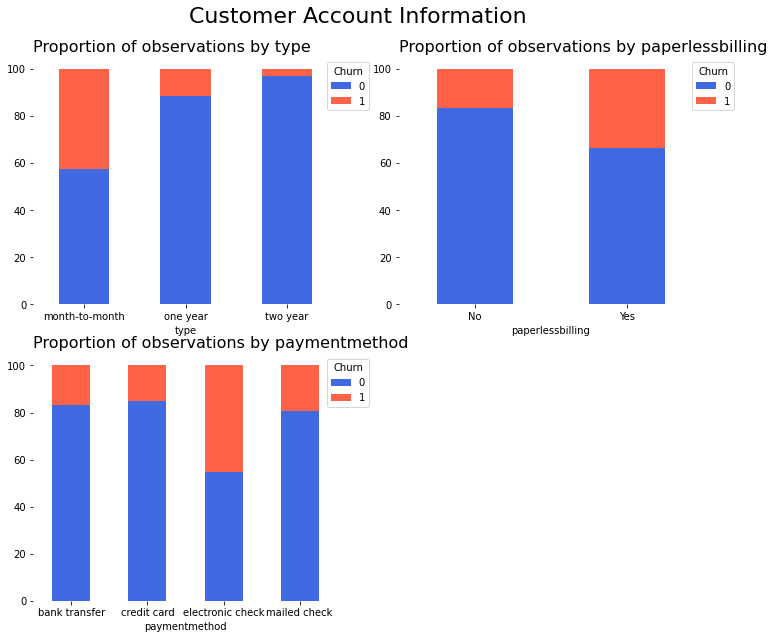

In [44]:

# customer account column names
account_columns = ['type', 'paperlessbilling', 'paymentmethod']

# stacked plot of customer account columns
percentage_stacked_plot(account_columns, 'Customer Account Information')

<div  style="border: solid black 2px; padding: 20px">

We can extract the following conclusions by analyzing Customer Account Information — Categorical variables:
* two -year contracts are less likely to churn
* month to month contracts are more likely to churn
* paper billing has no clear influence on churn
* electronic check payment methods are likely to churn more than other payment methods  

##### Customer Account Information — Numerical variables <a class="anchor" id="CustomerAccountNumerical"></a>

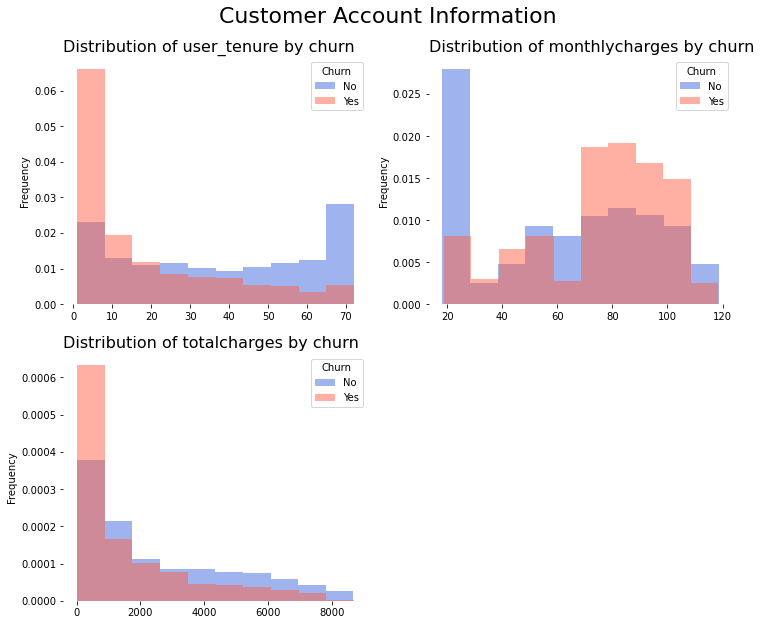

In [45]:
def histogram_plots(columns_to_plot, super_title):
    # set number of rows and number of columns
    number_of_columns = 2
    number_of_rows = math.ceil(len(columns_to_plot)/2)

    # create a figure
    fig = plt.figure(figsize=(12, 5 * number_of_rows)) 
    fig.suptitle(super_title, fontsize=22,  y=.95)
 

    # loop to each demographic column name to create a subplot
    for index, column in enumerate(columns_to_plot, 1):

        # create the subplot
        ax = fig.add_subplot(number_of_rows, number_of_columns, index)

        # histograms for each class (normalized histogram)
        df_telco[df_telco['enddate']==0][column].plot(kind='hist', ax=ax, density=True, 
                                                       alpha=0.5, color='royalblue', label='No')
        df_telco[df_telco['enddate']==1][column].plot(kind='hist', ax=ax, density=True,
                                                        alpha=0.5, color='tomato', label='Yes')
        
        # set the legend in the upper right corner
        ax.legend(loc="upper right", bbox_to_anchor=(0.5, 0.5, 0.5, 0.5),
                  title='Churn', fancybox=True)

        # set title and labels
        ax.set_title('Distribution of ' + column + ' by churn',
                     fontsize=16, loc='left')

        ax.tick_params(rotation='auto')

        # eliminate the frame from the plot
        spine_names = ('top', 'right', 'bottom', 'left')
        for spine_name in spine_names:
            ax.spines[spine_name].set_visible(False)
            
# customer account column names
account_columns_numeric = ['user_tenure', 'monthlycharges', 'totalcharges']
# histogram of costumer account columns 
histogram_plots(account_columns_numeric, 'Customer Account Information')

<div  style="border: solid black 2px; padding: 20px"> 
We can extract the following conclusions by analyzing the histograms for Numerical variables :

    * The churn rate tends to be larger when monthly charges are high.
    * New customers (low tenure) are more likely to churn.
    * Customers with high total charges are less likely to leave the company.

##### Services Information <a class="anchor" id="ServicesInformation"></a>


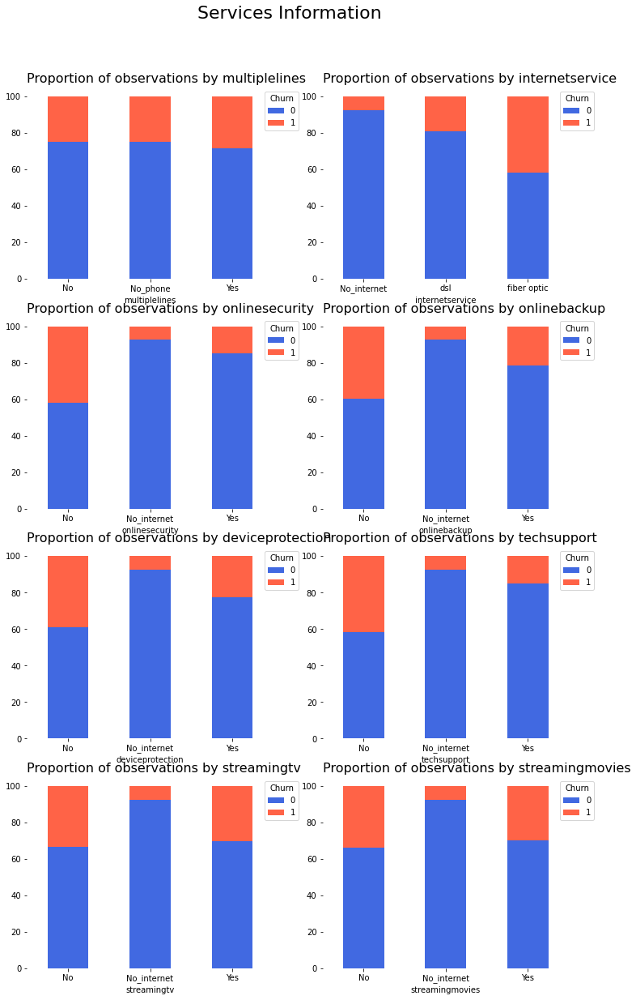

In [46]:
# services column names
services_columns = [
 'multiplelines',
 'internetservice',
 'onlinesecurity',
 'onlinebackup',
 'deviceprotection',
 'techsupport',
 'streamingtv',
 'streamingmovies']

# stacked plot of services columns
percentage_stacked_plot(services_columns, 'Services Information')

<div  style="border: solid black 2px; padding: 20px"> 
We can extract the following conclusions by analyzing Services Information:
    
* multiple lines has no influence on churn
* different internet service - (fiber, DSL, no internet) influences churn
* different internet security influences churn
* different online backup security has an influence on churn
* different online tech support has an influence on churn
* streaming services have no clear influence. 

##### Feature importance <a class="anchor" id="Featureimportance"></a>

In [47]:
def compute_mutual_information(categorical_serie):
    return metrics.mutual_info_score(categorical_serie, df_telco.enddate)

# select categorial variables excluding the response variable 
categorical_variables = df_telco
categorical_variables = df_telco.drop(['enddate','customerid'], axis=1)

# compute the mutual information score between each categorical variable and the target
feature_importance = categorical_variables.apply(compute_mutual_information).sort_values(ascending=False).reset_index()
feature_importance.columns = ['feature','importance']
feature_importance.sort_values(by='importance')
# visualize feature importance
print(feature_importance)

             feature  importance
0         churn_date    0.579021
1       totalcharges    0.537530
2     monthlycharges    0.173835
3               type    0.098182
4          begindate    0.092840
5        user_tenure    0.078950
6     onlinesecurity    0.064528
7        techsupport    0.062873
8    internetservice    0.055394
9       onlinebackup    0.046659
10     paymentmethod    0.044423
11  deviceprotection    0.043784
12   streamingmovies    0.031918
13       streamingtv    0.031803
14  paperlessbilling    0.019119
15        dependents    0.014270
16           partner    0.011383
17     seniorcitizen    0.010533
18     multiplelines    0.000798
19            gender    0.000037


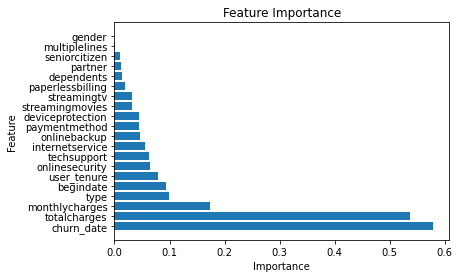

In [48]:

plt.barh(feature_importance['feature'],feature_importance['importance'])
plt.title('Feature Importance')
plt.ylabel('Feature')
plt.xlabel('Importance')
plt.show()


<div  style="border: solid black 2px; padding: 20px"> 
We can extract the following conclusions by analyzing the graph above:
    
* The features: gender, multiple lines, senior citizen, partner, and dependent has the lowest importance to the target
* the features: charges: monthly or total has the highest importance to the target  

moving forward:
* The features begin date, churn_date will be removed, as they can cause data leakage.
* In addition, only trial and error will determine which feature can or can not have an influence on the model roc_auc value. Hence, for now, all the features will stay and later might be removed.

##### customer exception<a class="anchor" id="customerexception"></a>

some customers registered for the services a month before the data was collected. Therefore they will be removed, as they do not represent correctly the real customers that left after one month.

In [49]:
df_telco2=df_telco.copy()
df_telco2=df_telco2.query('begindate<"2020-01-01"')

print(df_telco.shape)
print(df_telco2.shape)

(7032, 22)
(6799, 22)


In [50]:
(7032-6799)/7032

0.03313424345847554

less than 10% is acceptable

## Work Plan<a class="anchor" id='Work_Plan'></a>

**A list of clarifying questions:**
* can I use customedr_left - a feature that has 0 for 'No' and 1 for the date, as the target instead of end-date?
* should I get rid of some of the features - mainly the ones that don't have any correlation with end-date/customer left? for example type of subscription: month to month and one-two years are important features and should be part of the model while having dependents does not correlate with the customer leaving or staying. 
* the target and some features are unbalanced - should I use sampling or downsampling? 


**A rough plan for solving the task:**

this is a classification problem - the target is end date - 'No' and date or - 0 and 1.

* I'll drop the unnecessary features - the ones that do not correlate at all with the target, and dates. 
* I'll split the data set into the training set and test set and scale the data - the monthly charges and total charges are in a different range from the other.
* I'll test different models - random forest classifier and gradient boost - using cross validation. 
* I'll choose the best one - best AUC-ROC and Accuracy and will try to improve it by upsampling or downsampling.
* I'll test the model on the test set with linear calssification. 


## Prepare data for machine learning<a class="anchor" id="Prepare"></a>


### Feature Engineering<a class="anchor" id="Engineering"></a>

**No modification**

The seniorcitizen feature is already a binary column and should not be modified.

#### Label Encoding<a class="anchor" id="LabelEncoding"></a>


Label encoding is used to replace categorical values with numerical values. This encoding replaces every category with a numerical label. In this project, we use label encoding with the following binary variables: 'gender', 'partner', 'dependents', 'paperlessbilling'.

And, using Label encoding for services, where there are more than two variables.

In [50]:
label_encoding_columns =  ['gender', 'partner', 'dependents', 'paperlessbilling']
for column in label_encoding_columns:
    if column == 'gender':
        df_telco2[column] = df_telco2[column].map({'Female': 1, 'Male': 0})
    else: 
        df_telco2[column] = df_telco2[column].map({'Yes': 1, 'No': 0}) 

In [51]:
services_columns

['multiplelines',
 'internetservice',
 'onlinesecurity',
 'onlinebackup',
 'deviceprotection',
 'techsupport',
 'streamingtv',
 'streamingmovies']

In [52]:
encoder = OrdinalEncoder()
encoder.fit_transform(df_telco2[services_columns])
df_telco2[services_columns] = encoder.transform(df_telco2[services_columns])

In [53]:
df_telco2[services_columns]= df_telco2[services_columns].astype(int)

In [54]:
#checking for missing values
report = df_telco2.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_telco2.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
begindate,0,0.0
churn_date,0,0.0
multiplelines,0,0.0
streamingmovies,0,0.0
streamingtv,0,0.0
techsupport,0,0.0
deviceprotection,0,0.0
onlinebackup,0,0.0
onlinesecurity,0,0.0


#### One-Hot Encoding<a class="anchor" id="One-HotEncoding"></a>

One-hot encoding creates a new binary column for each level of the categorical variable. The new column contains zeros and ones indicating the absence or presence of the category in the data.

In this project, we apply one-hot encoding to the following categorical features: 'type', 'paymentmethod'

In [55]:
# one-hot encoding (categorical variables with more than two levels)
one_hot_encoding_columns = ['type','paymentmethod']

# encode categorical variables with more than two levels using one-hot encoding
df_telco2 = pd.get_dummies(df_telco2, columns = one_hot_encoding_columns)


In [56]:
#checking for missing values
report = df_telco2.isna().sum().to_frame()
report = report.rename(columns = {0: 'missing_values'})
report['% of total'] = (report['missing_values'] / df_telco2.shape[0]).round(2)
report.sort_values(by = 'missing_values', ascending = False)

,missing_values,% of total
customerid,0,0.0
techsupport,0,0.0
paymentmethod_electronic check,0,0.0
paymentmethod_credit card,0,0.0
paymentmethod_bank transfer,0,0.0
type_two year,0,0.0
type_one year,0,0.0
type_month-to-month,0,0.0
user_tenure,0,0.0
churn_date,0,0.0


### checking for outliers<a class="anchor" id="outliers"></a>

outliers may influence the models and skew the result. However, excluding outliers may not always be the best approach. only trial and error can show the real effect on the models. 

In [57]:
l =['begindate',
 'monthlycharges',
 'totalcharges',
 'gender',
 'seniorcitizen',
 'partner',
 'dependents',
 'internetservice',
 'onlinesecurity',
 'onlinebackup',
 'deviceprotection',
 'techsupport',
 'streamingtv',
 'streamingmovies',
 'multiplelines',
 'churn_date',
 'user_tenure',
 'type_month-to-month',
 'type_one year',
 'type_two year',
 'paymentmethod_bank transfer',
 'paymentmethod_credit card',
 'paymentmethod_electronic check',
 'paymentmethod_mailed check']

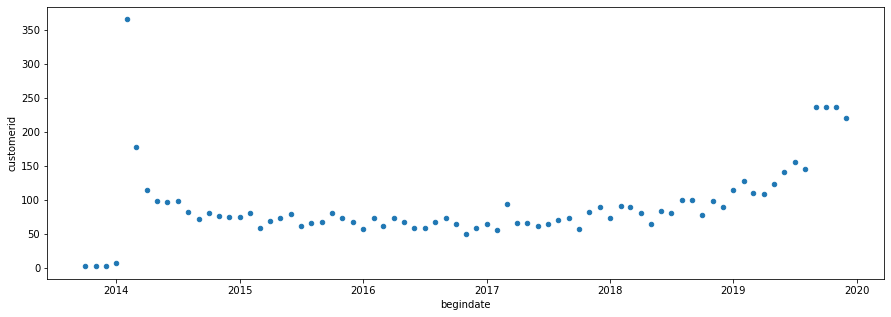

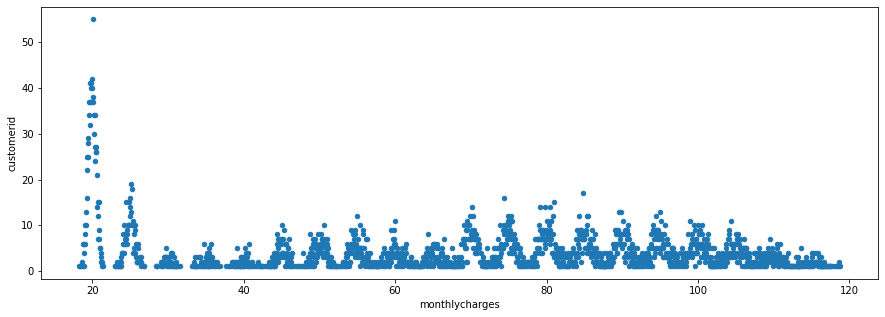

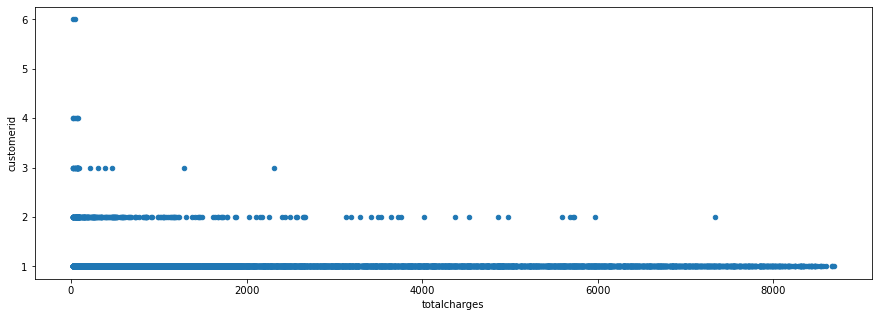

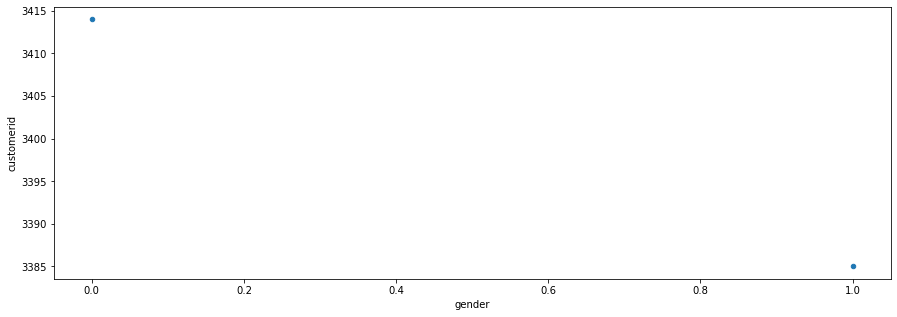

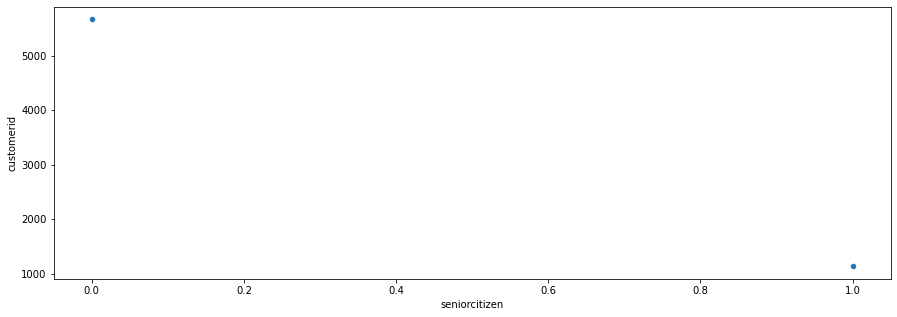

...

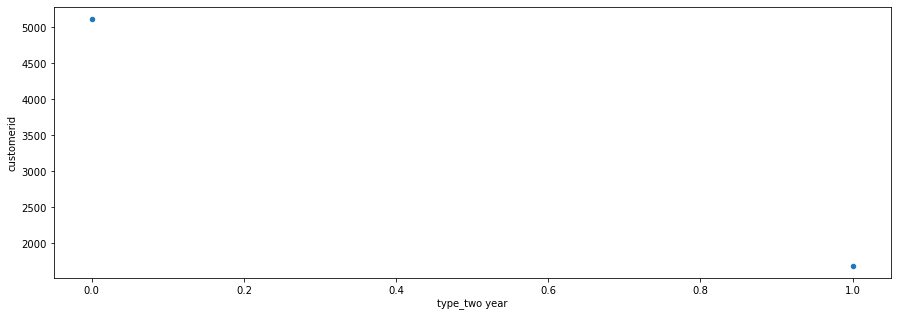

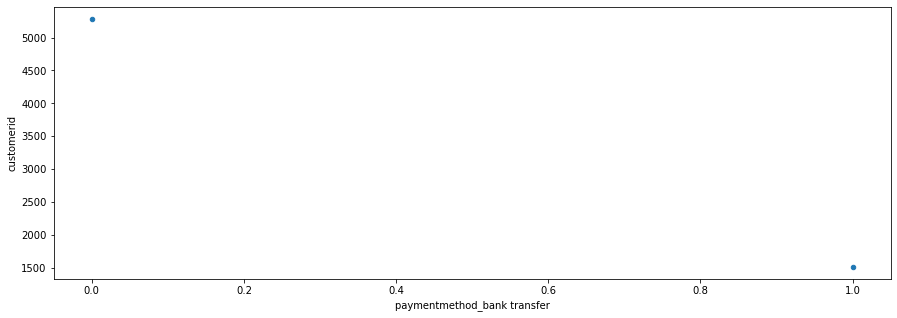

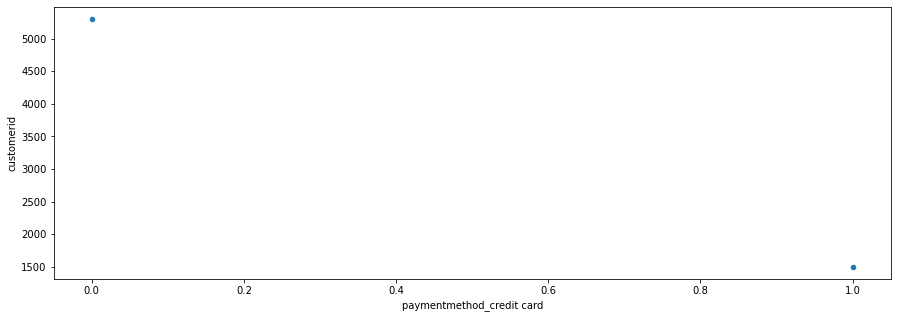

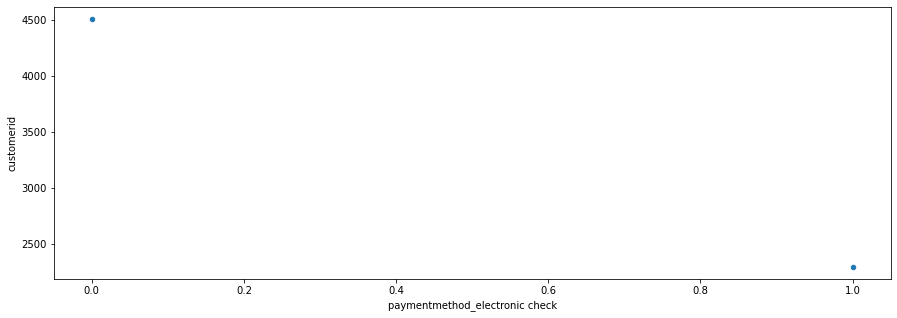

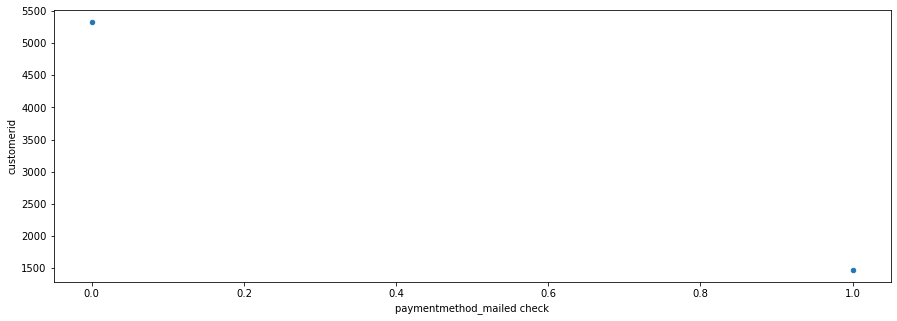

In [59]:
for i in l:
    d = df_telco2.groupby(i)['customerid'].count().reset_index()
    fig = plt.figure(figsize=(15,5))
    ax = plt.axes()
    d.plot(kind='scatter',x=i,y='customerid',ax=ax)

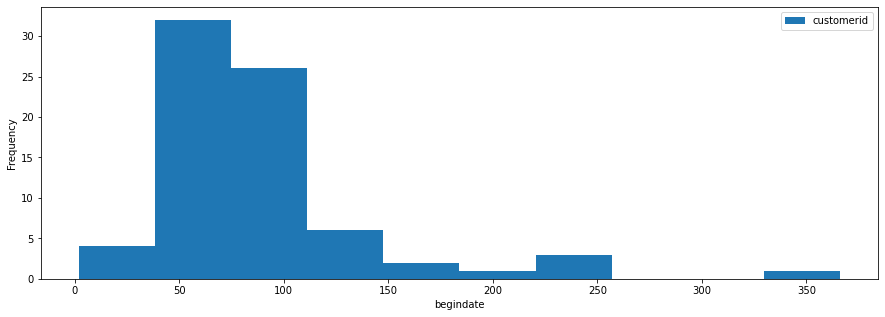

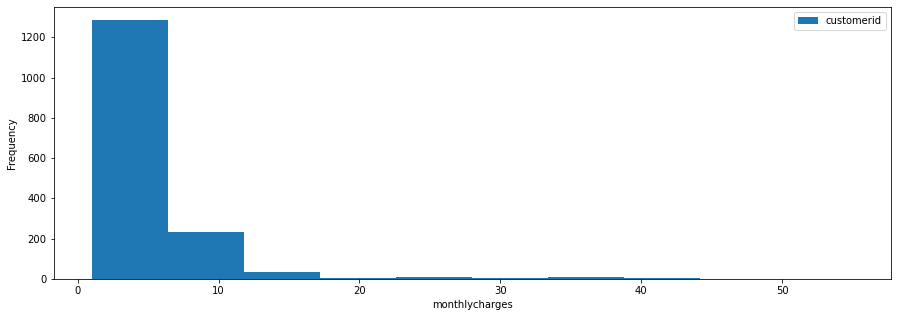

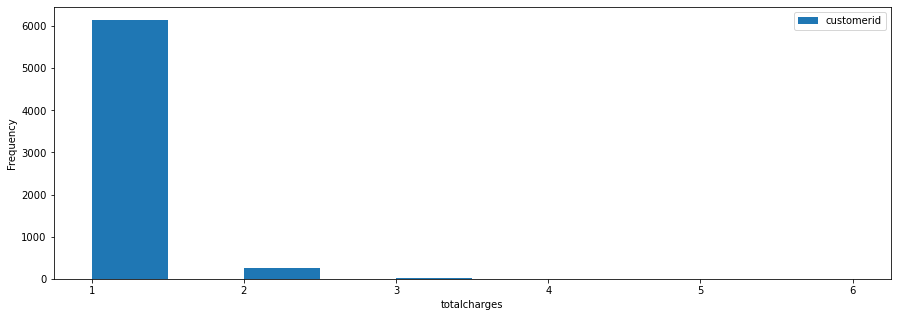

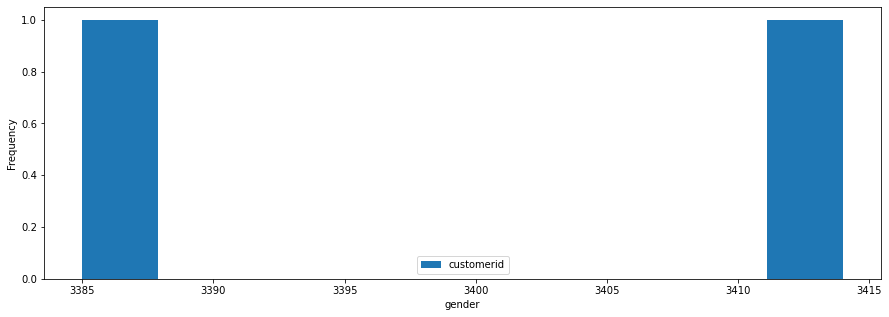

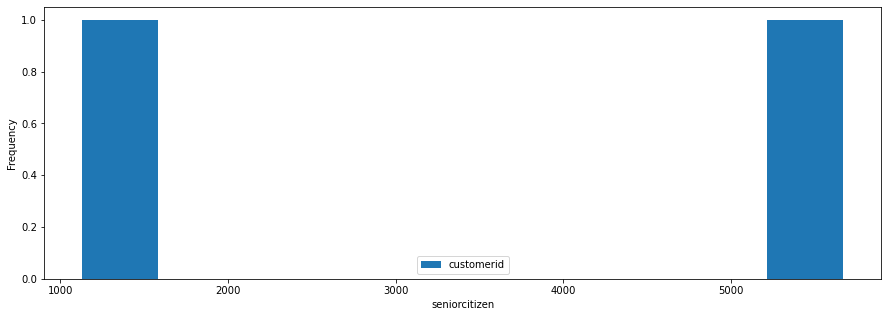

...

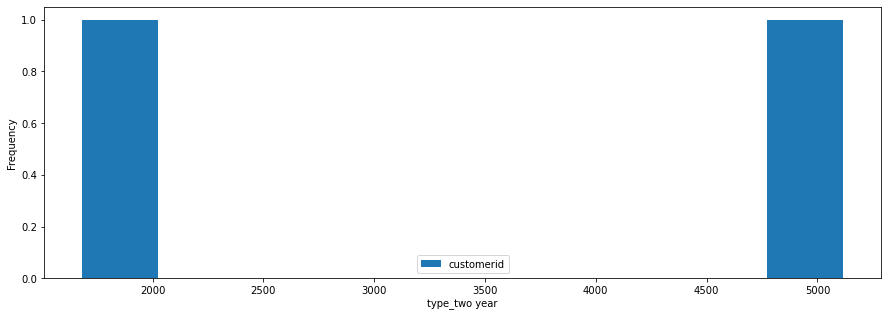

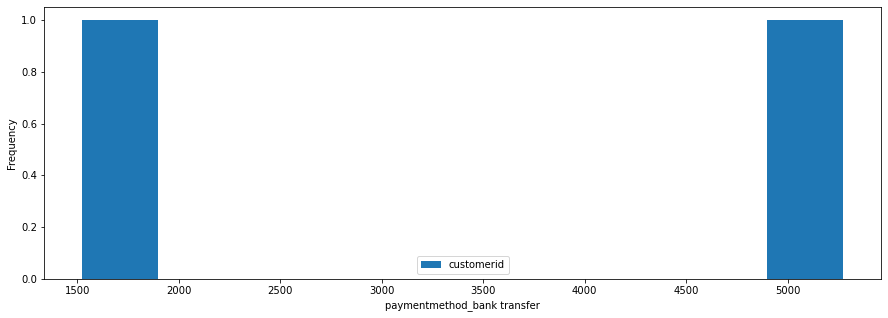

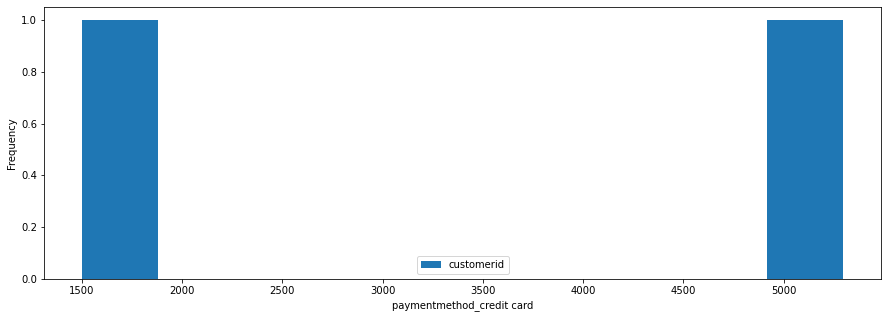

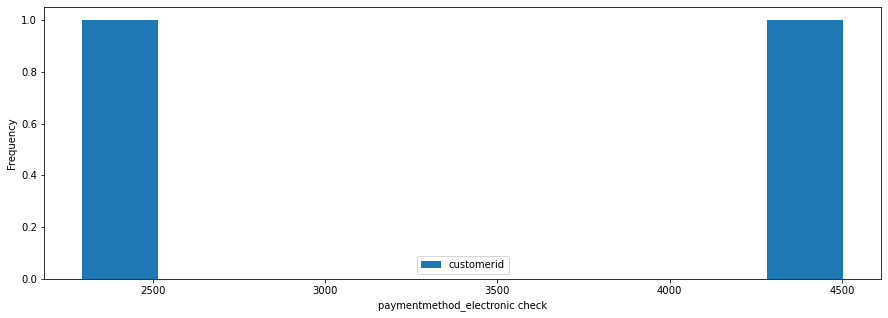

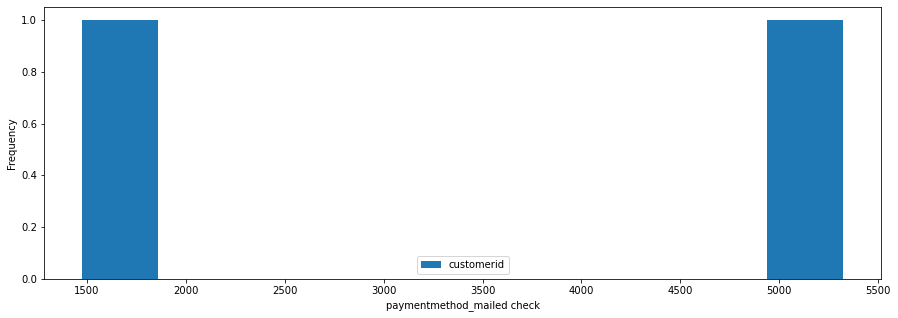

In [60]:
for i in l:
    d = df_telco2.groupby(i)['customerid'].count().reset_index()
    fig = plt.figure(figsize=(15,5))
    ax = plt.axes()
    plt.xlabel(i)
    d.plot(kind='hist',x=i,y='customerid',ax=ax)

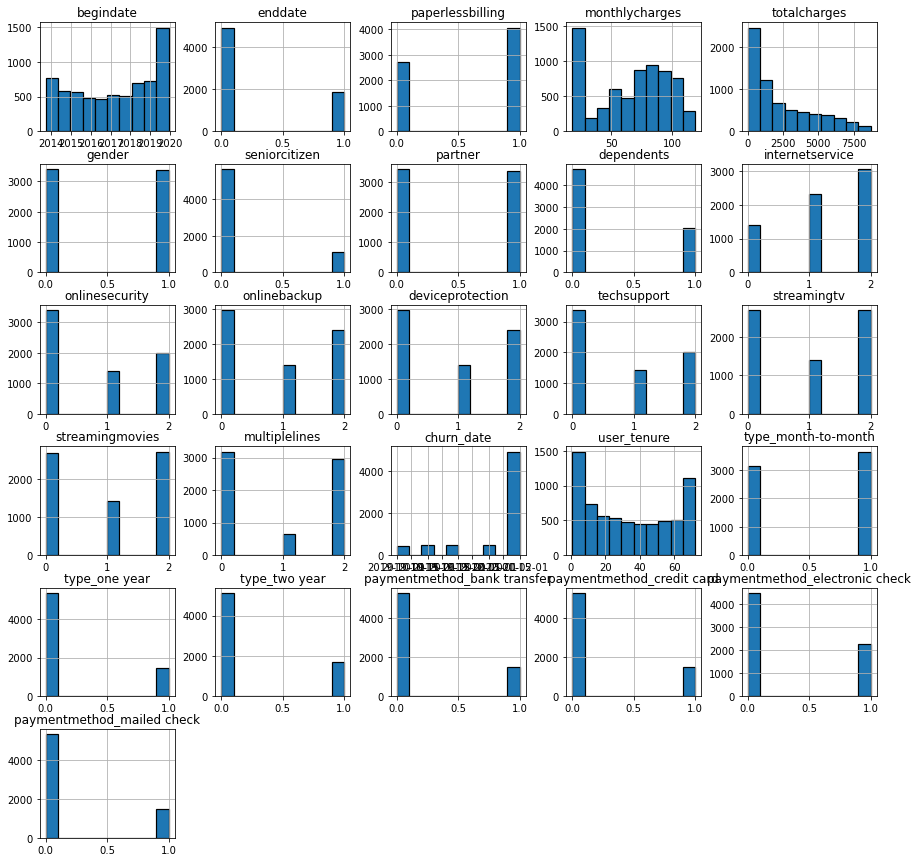

In [61]:
df_telco2.hist(edgecolor='black', linewidth=1.2, figsize=(15,15));

In [62]:
begindate = df_telco2.groupby('begindate')['customerid'].count().reset_index()
begindate = begindate.sort_values(by='customerid',ascending=False)
begindate

,begindate,customerid
4,2014-02-01,366
71,2019-09-01,237
73,2019-11-01,237
72,2019-10-01,237
74,2019-12-01,220
...,...,...
37,2016-11-01,50
3,2014-01-01,7
2,2013-12-01,3
0,2013-10-01,3


In [58]:
begindate = df_telco2.groupby('begindate')['customerid'].count().reset_index()
begindate = begindate.sort_values(by='begindate')
begindate.head(20)

,begindate,customerid
0,2013-10-01,3
1,2013-11-01,2
2,2013-12-01,3
3,2014-01-01,7
4,2014-02-01,366
5,2014-03-01,178
6,2014-04-01,114
7,2014-05-01,98
8,2014-06-01,97
9,2014-07-01,98


<div  style="border: solid black 2px; padding: 20px"> 
There seem to be some outliers in the begindate features. for now, I will not address them, as they may or may not affect the model quality. 

### spliting the data<a class="anchor" id="spliting"></a>

In [59]:
#removing features that may cause data leakage and the customerid - The customerID column is useless to explain whether not the customer will churn.
data_ml=df_telco2.copy() 

data_ml = data_ml.drop(['customerid','begindate','churn_date'],axis=1)

In [60]:
df_train, df_test = train_test_split(data_ml, test_size=0.25, random_state=12345)

In [61]:

target_train = df_train['enddate']
target_test = df_test['enddate']
print("target_train:",target_train.shape)
print("target_test:",target_test.shape)
features_train = df_train.drop('enddate',axis=1)
features_test = df_test.drop('enddate',axis=1)
print("features_train:",features_train.shape)
print("features_test:",features_test.shape)

target_train: (5099,)
target_test: (1700,)
features_train: (5099, 23)
features_test: (1700, 23)


In [62]:
target_train.shape

(5099,)

In [63]:
features_train.shape

(5099, 23)

### scaling<a class="anchor" id="scaling"></a>

In [64]:
#Create a MinMaxScaler instance.
scaler = MinMaxScaler()

#Scale data in scale_columns for training and testing datasets.
features_train_scaled = pd.DataFrame(scaler.fit_transform(features_train.copy()), columns = features_train.columns)
features_test_scaled = pd.DataFrame(scaler.transform(features_test.copy()), columns = features_train.columns)

## models<a class="anchor" id="models"></a>

In [65]:
#creat a function to evaluate tbe models
def evaluate_model(features,target,name,model):


# Run classifier with cross-validation and plot ROC curves
    X= features
    y = target
    scaler = MinMaxScaler()
    cv = StratifiedKFold(n_splits=5)
    classifier = model
    skf = StratifiedKFold(n_splits=5)
    skf.get_n_splits(X, y)
    #tprs = []
    #aucs = []
    #mean_fpr = np.linspace(0, 1, 100)
    X= features_train
    y = target_train
    roc_auc_scores=[]
    accuracys= []
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    fig, ax = plt.subplots()
    for i, (train, valid) in enumerate(cv.split(X, y)):
        X_train= X.iloc[train]
        X_valid = X.iloc[valid]
        X_train_scale =  pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
        X_valid_scale =  pd.DataFrame(scaler.transform(X_valid), columns = X_train.columns)
        classifier.fit(X_train_scale, y.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            classifier,
            X_valid_scale,
            y.iloc[valid],
            name="ROC fold {}".format(i),
            alpha=0.3,
            lw=1,
            ax=ax,
        )
        interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)

        probabilities_test= classifier.predict_proba(X_valid_scale)
        probabilities_one_test= probabilities_test[:, 1]
        accuracy=metrics.accuracy_score(y.iloc[valid], probabilities_one_test.round())
        accuracys.append(accuracy)
        roc_auc_scores.append(roc_auc_score(y.iloc[valid], probabilities_one_test))


    ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="b",
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

    ax.set(
        xlim=[-0.05, 1.05],
        ylim=[-0.05, 1.05],
        title=name,
    )
    ax.legend(loc="lower right")
    plt.show()
    print('Average auc_roc cross validation score for model:', name, mean(roc_auc_scores))
    print('Average accuracys cross validation score for model:',name,mean(accuracys))




### Random forest classfier<a class="anchor" id="Randomforest"></a>

In [66]:
#Create function to train and fit models using GridSearchCV
def train_fit_score(model, params, name,scoring):
    model = GridSearchCV(model, param_grid=params, cv=5, scoring=scoring, verbose=10, refit=True)
    model.fit(features_train, target_train)
    return pd.DataFrame([[name, abs(model.best_score_), model.best_params_]], columns=['Estimator', 'Best Score', 'Best Params'])

In [116]:
pipe_rf = Pipeline([('scaler', MinMaxScaler()), ('rf', RandomForestClassifier(random_state=12345,class_weight='balanced'))])
params_rf = { 'rf__n_estimators': range(100,200,25),'rf__max_depth' : range(1, 10, 1)}
RandomForest = train_fit_score(pipe_rf, params_rf, 'RandomForestClassifier',scoring='roc_auc')
print(list(RandomForest['Best Params']))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5; 1/36] START rf__max_depth=1, rf__n_estimators=100......................
[CV 1/5; 1/36] END rf__max_depth=1, rf__n_estimators=100;, score=0.835 total time=   0.3s
[CV 2/5; 1/36] START rf__max_depth=1, rf__n_estimators=100......................
[CV 2/5; 1/36] END rf__max_depth=1, rf__n_estimators=100;, score=0.854 total time=   0.4s
[CV 3/5; 1/36] START rf__max_depth=1, rf__n_estimators=100......................
[CV 3/5; 1/36] END rf__max_depth=1, rf__n_estimators=100;, score=0.857 total time=   0.4s
[CV 4/5; 1/36] START rf__max_depth=1, rf__n_estimators=100......................
[CV 4/5; 1/36] END rf__max_depth=1, rf__n_estimators=100;, score=0.837 total time=   0.4s
[CV 5/5; 1/36] START rf__max_depth=1, rf__n_estimators=100......................
[CV 5/5; 1/36] END rf__max_depth=1, rf__n_estimators=100;, score=0.827 total time=   0.4s
[CV 1/5; 2/36] START rf__max_depth=1, rf__n_estimators=125......................
[C

In [117]:
RandomForest

,Estimator,Best Score,Best Params
0,RandomForestClassifier,0.869593,"{'rf__max_depth': 6, 'rf__n_estimators': 175}"


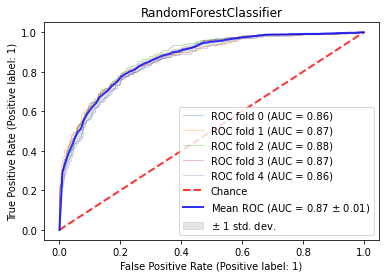

Average auc_roc cross validation score for model: RandomForestClassifier 0.8692561819365204
Average accuracys cross validation score for model: RandomForestClassifier 0.7848598202774731


In [166]:
evaluate_model(features_train,target_train,'RandomForestClassifier',RandomForestClassifier(max_depth=7, n_estimators= 175,random_state=12345,class_weight='balanced'))

### Gradient Boosting<a class="anchor" id="GradientBoosting"></a>

#### Gradient Boosting Classifier<a class="anchor" id="GradientBoostingClassifier"></a>

In [72]:
pipe_gbc = Pipeline([('scaler', MinMaxScaler()), ('gbc',GradientBoostingClassifier())])
params_gbc = {'gbc__n_estimators': [80, 90, 100, 110, 115, 120],
                   'gbc__max_depth': [3, 4, 5, 6],
                   'gbc__max_features': [None, 'auto', 'sqrt', 'log2'], 
                   'gbc__min_samples_split': [2, 3, 4, 5,6,7,8,9,10]}
GradientBoosting = train_fit_score(pipe_gbc, params_gbc, 'GradientBoostingClassifier',scoring='roc_auc')
print(list(GradientBoosting['Best Params']))

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
[CV 1/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 1/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.882 total time=   1.3s
[CV 2/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 2/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.872 total time=   1.1s
[CV 3/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 3/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.869 total time=   1.3s
[CV 4/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 4/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc_

In [79]:
GradientBoosting

,Estimator,Best Score,Best Params
0,GradientBoostingClassifier,0.873024,"{'gbc__max_depth': 3, 'gbc__max_features': 'lo..."


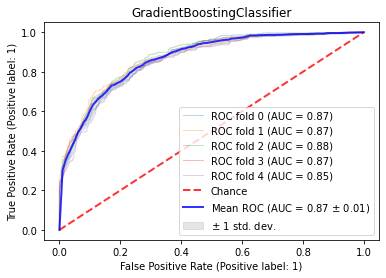

Average auc_roc cross validation score for model: GradientBoostingClassifier 0.8686657443612843
Average accuracys cross validation score for model: GradientBoostingClassifier 0.8144709345956243


In [170]:
evaluate_model(features_train,target_train,'GradientBoostingClassifier',GradientBoostingClassifier(max_depth= 3, max_features= 'log2', min_samples_split= 5, n_estimators= 90))

#### Lightgbm Classifier<a class="anchor" id="LightgbmClassifier"></a>

In [74]:
pipe_lgb = Pipeline([('scaler', MinMaxScaler()), ('lgb',lgb.LGBMClassifier())])
params_lgb = {'lgb__task' : ['predict'],
     'lgb__boosting': ['gbdt' ],
     'lgb__num_iterations': range(50,200,50),
    'lgb__num_leaves':range(10,100,20),
    'lgb__max_depth' :range(10,100,20),
    'lgb__class_weight':['balanced'],
    'lgb__learning_rate':[0.1,0.2,0.3,0.4]}

lgbmClassifier = train_fit_score(pipe_lgb, params_lgb, 'LGBMClassifier',scoring='roc_auc')
print(list(lgbmClassifier['Best Params']))

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
[CV 1/5; 1/300] START lgb__boosting=gbdt, lgb__class_weight=balanced, lgb__learning_rate=0.1, lgb__max_depth=10, lgb__num_iterations=50, lgb__num_leaves=10, lgb__task=predict
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[CV 1/5; 1/300] END lgb__boosting=gbdt, lgb__class_weight=balanced, lgb__learning_rate=0.1, lgb__max_depth=10, lgb__num_iterations=50, lgb__num_leaves=10, lgb__task=predict;, score=0.876 total time=   0.0s
[CV 2/5; 1/300] START lgb__boosting=gbdt, lgb__class_weight=balanced, lgb__learning_rate=0.1, lgb__max_depth=10, lgb__num_iterations=50, lgb__num_leaves=10, lgb__task=predict
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[CV 2/5; 1/300] END lgb__boosting=gbdt, lgb__class_weight=balanced, lgb__learning_rate=0.1, lgb__max_depth=10, lgb__num_iterations=50, lgb__num_leaves=10, lgb__task

In [75]:
lgbmClassifier

,Estimator,Best Score,Best Params
0,LGBMClassifier,0.870177,"{'lgb__boosting': 'gbdt', 'lgb__class_weight':..."


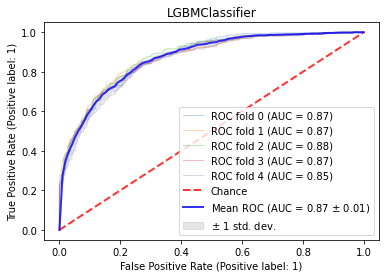

Average auc_roc cross validation score for model: LGBMClassifier 0.8694265493577125
Average accuracys cross validation score for model: LGBMClassifier 0.7764257538147742


In [171]:
evaluate_model(features_train,target_train,'LGBMClassifier',lgb.LGBMClassifier(class_weight= 'balanced', learning_rate= 0.1, max_depth= 10, num_iterations= 50, num_leaves= 10, task= 'predict'))

#### CatBoost Classifier<a class="anchor" id="CatBoostClassifier"></a>

In [76]:
pipe_cbr = Pipeline([('scaler', MinMaxScaler()), ('cb',cb.CatBoostClassifier())])
params_cbr = {'cb__iterations': range(50,200,50),'cb__max_depth' : range(4,20,4),'cb__learning_rate' : [0.01,0.02,0.03,0.04]}

CatBoostClassifier = train_fit_score(pipe_cbr, params_cbr, 'CatBoostClassifier',scoring='roc_auc')
print(list(CatBoostClassifier['Best Params']))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START cb__iterations=50, cb__learning_rate=0.01, cb__max_depth=4.
0:	learn: 0.6870701	total: 181ms	remaining: 8.85s
1:	learn: 0.6796576	total: 182ms	remaining: 4.36s
2:	learn: 0.6720105	total: 183ms	remaining: 2.86s
3:	learn: 0.6652655	total: 184ms	remaining: 2.12s
4:	learn: 0.6584815	total: 185ms	remaining: 1.67s
5:	learn: 0.6512070	total: 186ms	remaining: 1.36s
6:	learn: 0.6442721	total: 187ms	remaining: 1.15s
7:	learn: 0.6375727	total: 188ms	remaining: 988ms
8:	learn: 0.6315424	total: 189ms	remaining: 862ms
9:	learn: 0.6258800	total: 190ms	remaining: 761ms
10:	learn: 0.6197412	total: 191ms	remaining: 679ms
11:	learn: 0.6139790	total: 192ms	remaining: 610ms
12:	learn: 0.6090013	total: 194ms	remaining: 551ms
13:	learn: 0.6031881	total: 195ms	remaining: 501ms
14:	learn: 0.5985229	total: 196ms	remaining: 457ms
15:	learn: 0.5941612	total: 197ms	remaining: 418ms
16:	learn: 0.5897250	total: 198ms	remaining: 384ms


In [78]:
CatBoostClassifier

,Estimator,Best Score,Best Params
0,CatBoostClassifier,0.872566,"{'cb__iterations': 150, 'cb__learning_rate': 0..."


0:	learn: 0.6693961	total: 2.37ms	remaining: 354ms
1:	learn: 0.6420129	total: 6.75ms	remaining: 500ms
2:	learn: 0.6164738	total: 9.33ms	remaining: 457ms
3:	learn: 0.5958688	total: 12.7ms	remaining: 464ms
4:	learn: 0.5816937	total: 17.4ms	remaining: 505ms
5:	learn: 0.5633979	total: 22.7ms	remaining: 545ms
6:	learn: 0.5490854	total: 27.5ms	remaining: 562ms
7:	learn: 0.5335385	total: 32.3ms	remaining: 573ms
8:	learn: 0.5230838	total: 37ms	remaining: 579ms
9:	learn: 0.5127385	total: 41.4ms	remaining: 580ms
10:	learn: 0.5034076	total: 46.3ms	remaining: 585ms
11:	learn: 0.4942418	total: 51.2ms	remaining: 589ms
12:	learn: 0.4869395	total: 56.2ms	remaining: 592ms
13:	learn: 0.4796166	total: 61.3ms	remaining: 596ms
14:	learn: 0.4707777	total: 66.2ms	remaining: 596ms
15:	learn: 0.4645333	total: 71.7ms	remaining: 600ms
16:	learn: 0.4592253	total: 76.5ms	remaining: 599ms
17:	learn: 0.4534796	total: 81.2ms	remaining: 596ms
18:	learn: 0.4486369	total: 86.1ms	remaining: 594ms
19:	learn: 0.4448439	tot

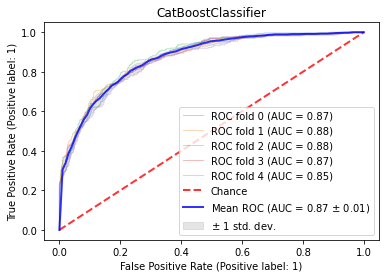

Average auc_roc cross validation score for model: CatBoostClassifier 0.8706502002228376
Average accuracys cross validation score for model: CatBoostClassifier 0.8170222632723354


In [172]:
evaluate_model(features_train,target_train,'CatBoostClassifier',cb.CatBoostClassifier(iterations= 150, learning_rate= 0.04, max_depth= 4))

<s>the models with the best accuracy and roc_auc value are GradientBoostingClassifier and CatBoostClassifier . 

### improving the model<a class="anchor" id="improving"></a>

The best two models are  Lightgbm Classifier and Gradient Boosting Classifier with 0.8783-7.Therefore, we will continue with one of them - the Gradient Boosting Classifier. 

the data is imbalanced, which has been mentioned before. therefore I'll try downsampling and upsampling to improve the mode. 

#### Resampling<a class="anchor" id="resampling"></a>

In [143]:

su = SMOTE(random_state=42)
X_su, y_su = su.fit_resample(features_train, target_train)

In [144]:
print(y_su.value_counts())


0    3670
1    3670
Name: enddate, dtype: int64


In [201]:
#Create function to train and fit models using GridSearchCV
def train_fit_score_up(model, params, name,scoring):
    model = GridSearchCV(model, param_grid=params, cv=5, scoring=scoring, verbose=10, refit=True)
    model.fit(X_su, y_su)
    return pd.DataFrame([[name, abs(model.best_score_), model.best_params_]], columns=['Estimator', 'Best Score', 'Best Params'])

In [193]:
pipe_gbc_up = Pipeline([('scaler', MinMaxScaler()), ('gbc',GradientBoostingClassifier())])
params_gbc_up = {'gbc__n_estimators': [80, 90, 100, 110, 115, 120],
                   'gbc__max_depth': [3, 4, 5, 6],
                   'gbc__max_features': [None, 'auto', 'sqrt', 'log2'], 
                   'gbc__min_samples_split': [2, 3, 4, 5,6,7,8,9,10]}
GradientBoosting_up = train_fit_score_up(pipe_gbc_up, params_gbc, 'GradientBoostingClassifier',scoring='roc_auc')
print(list(GradientBoosting_up['Best Params']))

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
[CV 1/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 1/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.860 total time=   0.3s
[CV 2/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 2/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.859 total time=   0.4s
[CV 3/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 3/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.986 total time=   0.3s
[CV 4/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 4/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc_

In [194]:
GradientBoosting_up

,Estimator,Best Score,Best Params
0,GradientBoostingClassifier,0.940495,"{'gbc__max_depth': 4, 'gbc__max_features': Non..."


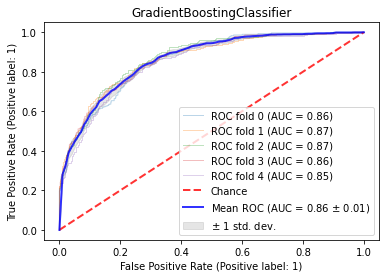

Average auc_roc cross validation score for model: GradientBoostingClassifier 0.8633993739421819
Average accuracys cross validation score for model: GradientBoostingClassifier 0.8129021147222383


In [173]:
evaluate_model(X_su, y_su,'GradientBoostingClassifier',GradientBoostingClassifier(max_depth= 4, max_features= None, min_samples_split= 8, n_estimators= 110))

In [202]:
pipe_cbr_up = Pipeline([('scaler', MinMaxScaler()), ('cb',cb.CatBoostClassifier())])
params_cbr_up = {'cb__iterations': range(50,200,50),'cb__max_depth' : range(4,20,4),'cb__learning_rate' : [0.01,0.02,0.03,0.04]}

CatBoostClassifier_up = train_fit_score_up(pipe_cbr_up, params_cbr_up, 'CatBoostClassifier',scoring='roc_auc')
print(list(CatBoostClassifier_up['Best Params']))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START cb__iterations=50, cb__learning_rate=0.01, cb__max_depth=4.
0:	learn: 0.6886791	total: 1.48ms	remaining: 72.5ms
1:	learn: 0.6843255	total: 3.51ms	remaining: 84.2ms
2:	learn: 0.6774690	total: 5.4ms	remaining: 84.6ms
3:	learn: 0.6729397	total: 7.19ms	remaining: 82.7ms
4:	learn: 0.6661962	total: 9.08ms	remaining: 81.7ms
5:	learn: 0.6616614	total: 10.9ms	remaining: 79.7ms
6:	learn: 0.6573769	total: 13.3ms	remaining: 81.8ms
7:	learn: 0.6530306	total: 16ms	remaining: 84.2ms
8:	learn: 0.6486750	total: 18ms	remaining: 82.1ms
9:	learn: 0.6433135	total: 20.1ms	remaining: 80.4ms
10:	learn: 0.6394478	total: 22ms	remaining: 78ms
11:	learn: 0.6334749	total: 33.8ms	remaining: 107ms
12:	learn: 0.6287355	total: 35.1ms	remaining: 99.9ms
13:	learn: 0.6253878	total: 36.4ms	remaining: 93.5ms
14:	learn: 0.6218737	total: 37.7ms	remaining: 87.9ms
15:	learn: 0.6185073	total: 38.9ms	remaining: 82.6ms
16:	learn: 0.6151575	total: 4

In [203]:
CatBoostClassifier_up

,Estimator,Best Score,Best Params
0,CatBoostClassifier,0.939523,"{'cb__iterations': 150, 'cb__learning_rate': 0..."


0:	learn: 0.6616506	total: 17.3ms	remaining: 2.58s
1:	learn: 0.6333162	total: 25.2ms	remaining: 1.87s
2:	learn: 0.6080612	total: 39.6ms	remaining: 1.94s
3:	learn: 0.5852287	total: 53.2ms	remaining: 1.94s
4:	learn: 0.5648615	total: 62.9ms	remaining: 1.82s
5:	learn: 0.5480886	total: 75.8ms	remaining: 1.82s
6:	learn: 0.5303950	total: 87.4ms	remaining: 1.79s
7:	learn: 0.5166877	total: 99.2ms	remaining: 1.76s
8:	learn: 0.5045900	total: 111ms	remaining: 1.74s
9:	learn: 0.4933246	total: 124ms	remaining: 1.73s
10:	learn: 0.4818462	total: 136ms	remaining: 1.72s
11:	learn: 0.4722976	total: 149ms	remaining: 1.71s
12:	learn: 0.4618261	total: 162ms	remaining: 1.7s
13:	learn: 0.4546526	total: 175ms	remaining: 1.7s
14:	learn: 0.4474493	total: 185ms	remaining: 1.67s
15:	learn: 0.4400319	total: 198ms	remaining: 1.66s
16:	learn: 0.4341539	total: 212ms	remaining: 1.66s
17:	learn: 0.4281825	total: 226ms	remaining: 1.65s
18:	learn: 0.4233134	total: 238ms	remaining: 1.64s
19:	learn: 0.4182185	total: 251ms	r

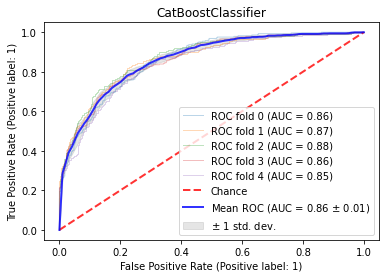

Average auc_roc cross validation score for model: CatBoostClassifier 0.8626841460083967
Average accuracys cross validation score for model: CatBoostClassifier 0.8109417152533241


In [204]:
evaluate_model(X_su, y_su,'CatBoostClassifier',cb.CatBoostClassifier(iterations= 150, learning_rate= 0.04, max_depth= 8))

The resampling did not improve the score

#### Eliminating features of less importance<a class="anchor" id="Eliminating"></a>

In [67]:
#removing features that may cause data leakage and the customerid - The customerID column is useless to explain whether not the customer will churn.
data_ml2=df_telco2.copy() 

data_ml2 = data_ml2.drop(['customerid','begindate','churn_date','dependents'],axis=1)

In [68]:
df_train2, df_test2 = train_test_split(data_ml2, test_size=0.25, random_state=12345)

In [69]:

target_train2 = df_train2['enddate']
target_test2 = df_test2['enddate']
print("target_train2:",target_train2.shape)
print("target_test:2",target_test2.shape)
features_train2 = df_train2.drop('enddate',axis=1)
features_test2 = df_test2.drop('enddate',axis=1)
print("features_train2:",features_train2.shape)
print("features_test2:",features_test2.shape)

target_train2: (5099,)
target_test:2 (1700,)
features_train2: (5099, 22)
features_test2: (1700, 22)


In [70]:
#Create a MinMaxScaler instance.
scaler = MinMaxScaler()

#Scale data in scale_columns for training and testing datasets.
features_train_scaled2 = pd.DataFrame(scaler.fit_transform(features_train2.copy()), columns = features_train2.columns)
features_test_scaled2 = pd.DataFrame(scaler.transform(features_test2.copy()), columns = features_train2.columns)

In [71]:
#Create function to train and fit models using GridSearchCV
def train_fit_score2(model, params, name,scoring):
    model = GridSearchCV(model, param_grid=params, cv=5, scoring=scoring, verbose=10, refit=True)
    model.fit(features_train2, target_train2)
    return pd.DataFrame([[name, abs(model.best_score_), model.best_params_]], columns=['Estimator', 'Best Score', 'Best Params'])

In [153]:
pipe_gbc_2 = Pipeline([('scaler', MinMaxScaler()), ('gbc',GradientBoostingClassifier())])
params_gbc_2 = {'gbc__n_estimators': [80, 90, 100, 110, 115, 120],
                   'gbc__max_depth': [3, 4, 5, 6],
                   'gbc__max_features': [None, 'auto', 'sqrt', 'log2'], 
                   'gbc__min_samples_split': [2, 3, 4, 5,6,7,8,9,10]}
GradientBoosting_2 = train_fit_score2(pipe_gbc_2, params_gbc_2, 'GradientBoostingClassifier',scoring='roc_auc')
print(list(GradientBoosting_2['Best Params']))

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
[CV 1/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 1/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.867 total time=   0.2s
[CV 2/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 2/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.871 total time=   0.2s
[CV 3/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 3/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80;, score=0.878 total time=   0.2s
[CV 4/5; 1/864] START gbc__max_depth=3, gbc__max_features=None, gbc__min_samples_split=2, gbc__n_estimators=80
[CV 4/5; 1/864] END gbc__max_depth=3, gbc__max_features=None, gbc_

In [154]:
GradientBoosting_2

,Estimator,Best Score,Best Params
0,GradientBoostingClassifier,0.871142,"{'gbc__max_depth': 3, 'gbc__max_features': 'sq..."


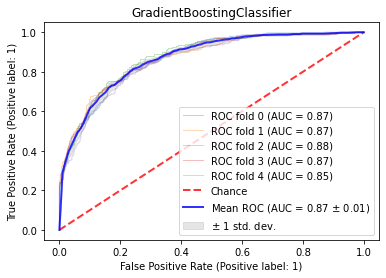

Average auc_roc cross validation score for model: GradientBoostingClassifier 0.8699205042292666
Average accuracys cross validation score for model: GradientBoostingClassifier 0.8144713194404356


In [199]:
evaluate_model(features_train2, target_train2,'GradientBoostingClassifier',GradientBoostingClassifier(max_depth= 3, max_features= 'sqrt', min_samples_split= 10, n_estimators= 80))

In [72]:
pipe_cbr2 = Pipeline([('scaler', MinMaxScaler()), ('cb',cb.CatBoostClassifier())])
params_cbr2 = {'cb__iterations': [100,150,200],'cb__max_depth' : [4,16],'cb__learning_rate' : [0.01,0.02,0.03,0.04],"cb__border_count":[100,200]}

CatBoostClassifier2 = train_fit_score2(pipe_cbr2, params_cbr2, 'CatBoostClassifier',scoring='roc_auc')
print(list(CatBoostClassifier2['Best Params']))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START cb__border_count=100, cb__iterations=100, cb__learning_rate=0.01, cb__max_depth=4
0:	learn: 0.6868409	total: 147ms	remaining: 14.5s
1:	learn: 0.6797056	total: 148ms	remaining: 7.25s
2:	learn: 0.6725119	total: 149ms	remaining: 4.82s
3:	learn: 0.6658415	total: 150ms	remaining: 3.6s
4:	learn: 0.6585067	total: 151ms	remaining: 2.87s
5:	learn: 0.6515559	total: 152ms	remaining: 2.39s
6:	learn: 0.6462863	total: 153ms	remaining: 2.04s
7:	learn: 0.6399837	total: 154ms	remaining: 1.78s
8:	learn: 0.6341222	total: 155ms	remaining: 1.57s
9:	learn: 0.6278443	total: 156ms	remaining: 1.41s
10:	learn: 0.6227160	total: 158ms	remaining: 1.27s
11:	learn: 0.6172108	total: 159ms	remaining: 1.16s
12:	learn: 0.6121484	total: 160ms	remaining: 1.07s
13:	learn: 0.6064641	total: 161ms	remaining: 989ms
14:	learn: 0.6019150	total: 162ms	remaining: 918ms
15:	learn: 0.5974538	total: 163ms	remaining: 856ms
16:	learn: 0.5921262	total: 16

In [74]:
CatBoostClassifier2

,Estimator,Best Score,Best Params
0,CatBoostClassifier,0.870422,"{'cb__border_count': 100, 'cb__iterations': 20..."


0:	learn: 0.6751946	total: 10.6ms	remaining: 2.11s
1:	learn: 0.6540093	total: 12ms	remaining: 1.19s
2:	learn: 0.6336967	total: 13.3ms	remaining: 874ms
3:	learn: 0.6167843	total: 14.4ms	remaining: 708ms
4:	learn: 0.6043152	total: 15.5ms	remaining: 603ms
5:	learn: 0.5891870	total: 16.5ms	remaining: 533ms
6:	learn: 0.5760328	total: 17.5ms	remaining: 483ms
7:	learn: 0.5656689	total: 18.5ms	remaining: 444ms
8:	learn: 0.5542297	total: 19.5ms	remaining: 414ms
9:	learn: 0.5422077	total: 20.6ms	remaining: 392ms
10:	learn: 0.5305190	total: 21.7ms	remaining: 373ms
11:	learn: 0.5234144	total: 22.7ms	remaining: 355ms
12:	learn: 0.5158569	total: 23.7ms	remaining: 340ms
13:	learn: 0.5080598	total: 24.7ms	remaining: 329ms
14:	learn: 0.5008135	total: 25.8ms	remaining: 318ms
15:	learn: 0.4943914	total: 26.9ms	remaining: 309ms
16:	learn: 0.4893617	total: 27.9ms	remaining: 301ms
17:	learn: 0.4821506	total: 29ms	remaining: 293ms
18:	learn: 0.4772954	total: 30ms	remaining: 286ms
19:	learn: 0.4727452	total: 

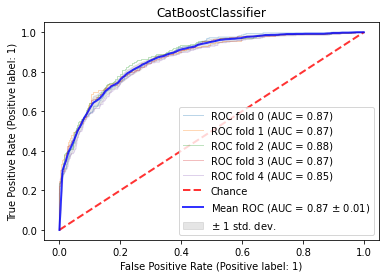

Average auc_roc cross validation score for model: CatBoostClassifier 0.8704929319449612
Average accuracys cross validation score for model: CatBoostClassifier 0.8193744347591834


In [75]:
evaluate_model(features_train2, target_train2,'CatBoostClassifier',cb.CatBoostClassifier(iterations= 200, learning_rate= 0.03, max_depth= 4,border_count=100))

## Testing the models with the test set

Both the CatBoostClassifier and the GradientBoostingClassifier had very close, so I'll use them both for the test set.

In [77]:
#creat a function to evaluate tbe models
def test_model(model,X_test,y_test):
    
    probabilities_test= model.predict_proba(X_test)
    probabilities_one_test= probabilities_test[:, 1]

    auc_roc= roc_auc_score(y_test, probabilities_one_test)
    print(str(model))
    print('auc_roc score:', auc_roc)
    accuracy=accuracy_score(y_test, probabilities_one_test.round())
    print('accuracy',accuracy)

In [79]:
model_gbc_model2 = GradientBoostingClassifier(max_depth= 3, max_features= 'sqrt', min_samples_split= 10, n_estimators= 80)
model_gbc_model2.fit(features_train_scaled2, target_train2)
test_model(model_gbc_model2,features_test_scaled2, target_test2)

GradientBoostingClassifier(max_features='sqrt', min_samples_split=10,
                           n_estimators=80)
auc_roc score: 0.8816278860028859
accuracy 0.8358823529411765


In [80]:
model_gbc_model2 = cb.CatBoostClassifier(iterations= 200, learning_rate= 0.03, max_depth= 4,border_count=100)
model_gbc_model2.fit(features_train_scaled2, target_train2)
test_model(model_gbc_model2,features_test_scaled2, target_test2)

0:	learn: 0.6746170	total: 1.21ms	remaining: 241ms
1:	learn: 0.6546621	total: 2.52ms	remaining: 249ms
2:	learn: 0.6356538	total: 3.71ms	remaining: 244ms
3:	learn: 0.6209129	total: 4.88ms	remaining: 239ms
4:	learn: 0.6035903	total: 6.15ms	remaining: 240ms
5:	learn: 0.5874787	total: 7.37ms	remaining: 238ms
6:	learn: 0.5760427	total: 8.72ms	remaining: 241ms
7:	learn: 0.5642837	total: 9.93ms	remaining: 238ms
8:	learn: 0.5542164	total: 11.5ms	remaining: 244ms
9:	learn: 0.5438113	total: 13ms	remaining: 246ms
10:	learn: 0.5342935	total: 14.2ms	remaining: 244ms
11:	learn: 0.5269016	total: 15.4ms	remaining: 241ms
12:	learn: 0.5204868	total: 16.6ms	remaining: 238ms
13:	learn: 0.5118565	total: 17.8ms	remaining: 236ms
14:	learn: 0.5035073	total: 19ms	remaining: 235ms
15:	learn: 0.4971901	total: 20.3ms	remaining: 234ms
16:	learn: 0.4891798	total: 21.7ms	remaining: 233ms
17:	learn: 0.4832909	total: 23ms	remaining: 233ms
18:	learn: 0.4784639	total: 24.3ms	remaining: 231ms
19:	learn: 0.4720129	total: 

<div  style="border: solid black 2px; padding: 20px"> 

The elimination of the features:  'dependents', 'partner' has provieded the best result for the roc_auc value - 0.881. 

### Baseline model for sanity check<a class="anchor" id='sanity'></a>

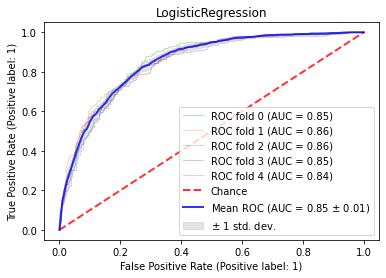

Average auc_roc cross validation score for model: LogisticRegression 0.8521514085130893
Average accuracys cross validation score for model: LogisticRegression 0.7540706959918413


In [183]:
evaluate_model(features_train2, target_train2,'LogisticRegression',LogisticRegression(random_state=12345, solver='liblinear',class_weight='balanced'))

In [210]:
model_lg = LogisticRegression(random_state=12345, solver='liblinear',class_weight='balanced')
model_lg.fit(features_train_scaled2, target_train2)
test_model(model_lg,features_test_scaled2, target_test2)

LogisticRegression(class_weight='balanced', random_state=12345,
                   solver='liblinear')
auc_roc score: 0.858982683982684
accuracy 0.7558823529411764


<div  style="border: solid black 2px; padding: 20px"> 

<s>the baseline model for sanity check has a roc_auc  value of 0.86, which means the elimination of the two features and the other feature engineering was fitting. <s>
    
the baseline model for sanity check has a roc_auc  value of 0.858, which means the elimination of the two features and the other feature engineering was fitting.

## Conclusion<a class="anchor" id='Conclusion'></a>

In this project, we have walked through a complete end-to-end machine learning project using the Telco customer Churn dataset. We started by cleaning the data and analyzing it with visualization. Then, to be able to build a machine learning model, we transformed the categorical data into numeric variables (feature engineering). After transforming the data, we tried different machine learning algorithms using hyperparameters tuning. 
Although the roc_auc values of the CatBoostClassifier and Gradient Boosting Classifier were ~0.87, we still tried to improve the mode. First, we tried downsampling and upsampling, due to the imbalance of the target. these methods had no improvement to the model roc_auc value. The second approach was to eliminate one or two features that may or may not affect the model's roc_auc value. this approach seems to have the best effect on the roc_auc vale, since removing both of the 'dependents', and 'partner' features were the best approach. 
Finally, with a tuned of the Gradient Boosting Classifier and CatBoostClassifier (best performance models) with all the model optimizations, obtaining a roc_auc of more than 88% and accurcy score of ~82.



## Solution Report<a class="anchor" id='Solution'></a>

* What steps of the plan were performed and what steps were skipped (explain why)?
    * I'll drop the unnecessary features - the ones that do not correlate at all with the target, and dates. - done
    * I'll split the data set into the training set and test set and scale the data - the monthly charges and total charges are in a different range from the other. -done
    * I'll test different models - random forest classifier and gradient boost - using cross-validation. -done
    * I'll choose the best one - best AUC-ROC and Accuracy and will try to improve it by upsampling or downsampling. - I switch to resampling, as by imbalance library that the reviewer recommended. 
    * I'll test the model on the test set with linear classification. - done using logistic regression. 


* What difficulties did you encounter and how did you manage to solve them?

    The AUC did not improve using model parameters hyper-tuning and resampling. therefore I tried to find other ways to try to improve it. Using this article: https://www.linkedin.com/pulse/how-improve-auc-amanda-zou/?trackingId=qreB2Yh1WD9alafd3SbVnA%3D%3D I have found that I can improve the AUC value by removing some features. I have used the importance graph to choose which feature to choose and by trial and error, I have chosen the 'dependants' feature. 
    
    
* What were some of the key steps to solving the task?
    * Data Reading and Data Cleaning
    * EDA
    * Feature Engineering
    * Models parameters hyper-tuning
    * Improving the Model
    * Testing the best model with the test set
    * Baseline model for a sanity check


* What is your final model and what quality score does it have?

    the final mode is: CatBoostClassifier
    
    its quality score is accuracy: 0.8370588235294117 and roc_auc:0.8804419191919192
